# Verify Hardware Availability

In [1]:
import tensorflow as tf
if tf.test.gpu_device_name():
  print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
  print("Please install GPU version of TF")

if tf.config.list_physical_devices('TPU'):
  print('TPU is available')
else:
  print('TPU is not available')

Default GPU Device: /device:GPU:0
TPU is not available



# Object Detection using TensorFlow and Pascal VOC 2007 Dataset

In this exercise, we will adapt our image classification task to an object detection task. Object detection involves not only classifying objects within an image but also localizing them with bounding boxes.

Note: Due to the limited computational resources available, we'll be using a smaller subset of the Pascal VOC 2007 dataset and a lightweight object detection model. This might result in lower accuracy, but the focus of this exercise is on understanding the concepts and workflow of object detection.

## Steps:
1. Install (if necessary) and Import the libraries you will need for this project
2. Load the Pascal VOC 2007 dataset
3. Use a pre-trained object detection model (SSD MobileNet V2)
4. Display detected objects with bounding boxes
    

In [2]:
%pip install tensorflow tensorflow-hub tensorflow-datasets matplotlib


In [3]:
# Import necessary libraries
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
from PIL import Image
import requests
from io import BytesIO
from google.colab import files

print("TensorFlow version:", tf.__version__)
print("TensorFlow Hub version:", hub.__version__)

TensorFlow version: 2.19.0
TensorFlow Hub version: 0.16.1



### Load the VOC2007 dataset

We will use the VOC2007 dataset, which contains images with annotations for object detection. For demonstration purposes, we will load a small subset of the dataset using TensorFlow Datasets.

- VOC2007 is a dataset for object detection, segmentation, and image classification.
- We define a function load_data to load the COCO dataset.
- tfds.load is a function that downloads and prepares the dataset.
- We use only 1% of the training data to keep the demonstration manageable.
- shuffle_files=True ensures that we get a random sample of the dataset.
- with_info=True returns additional information about the dataset, which we'll use later.

- The PASCAL VOC2007 (Visual Object Classes) dataset is a widely used benchmark dataset for object recognition tasks in computer vision. It comprises a collection of images annotated with bounding boxes and class labels for objects belonging to 20 different categories.

Key characteristics of the VOC2007 dataset:

- Purpose: Primarily used for training and evaluating object detection algorithms, but also applicable to other tasks like image classification and semantic segmentation.
- Object Categories: Includes a diverse set of 20 object classes, ranging from people and animals to vehicles and indoor items.
- Data Format: The dataset provides images along with corresponding annotation files containing bounding box coordinates and class labels for each object in the image.
- Image Variety: Features a wide range of images captured in diverse real-world scenarios, offering realistic challenges for object recognition models.
- Benchmark: Serves as a standard benchmark for comparing the performance of different object detection algorithms, fostering progress in the field.

Common use cases of the VOC2007 dataset:
- Training: Used as training data to teach object detection models to identify and localize objects within images.
- Evaluation: Employed to evaluate the performance of trained models by comparing their predictions against the ground truth annotations.
- Research: Utilized in research to develop and test new object detection algorithms and techniques.

In [4]:
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# Load a smaller dataset
def load_data(split='train'):
    dataset, info = tfds.load('voc/2007', split=split, shuffle_files=True, with_info=True)
    return dataset, info

# Load the train dataset and extract info
train_dataset, train_info = load_data('train[:10%]')

# Load the validation dataset
validation_dataset, validation_info = load_data('validation[:10%]')

# Get class names
class_names = train_info.features["objects"]["label"].names  # Changed from ds_info to train_info
print("Class names:", class_names)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/incomplete.VK5FXB_5.0.0/voc-test.tfrecord*...:   0%|          | 0…

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/incomplete.VK5FXB_5.0.0/voc-train.tfrecord*...:   0%|          | …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/incomplete.VK5FXB_5.0.0/voc-validation.tfrecord*...:   0%|       …

Dataset voc downloaded and prepared to /root/tensorflow_datasets/voc/2007/5.0.0. Subsequent calls will reuse this data.
Class names: ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


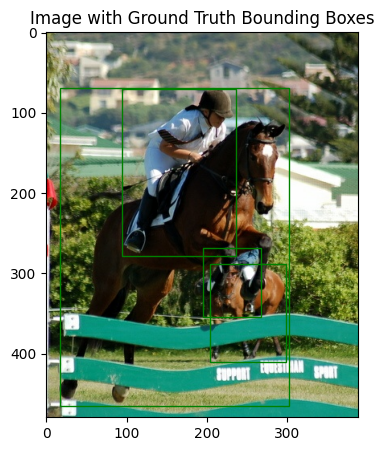

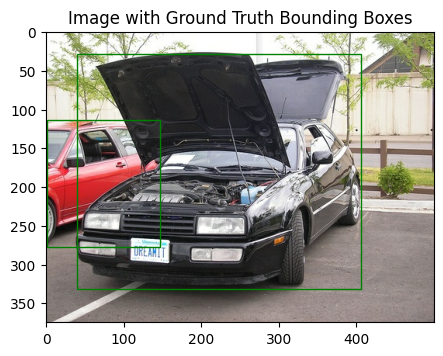

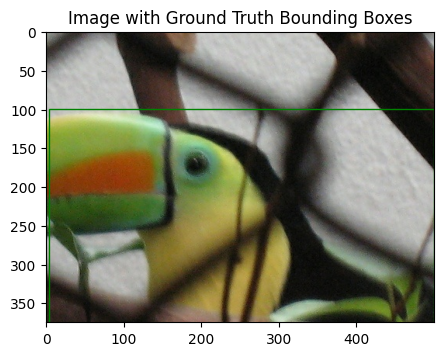

In [5]:
def display_examples(dataset, n=3):  # Display 'n' examples by default
    for example in dataset.take(n):
        image = example["image"]
        plt.figure(figsize=(5, 5))
        plt.imshow(image)
        plt.title("Image with Ground Truth Bounding Boxes")

        # Draw ground truth boxes
        for box in example["objects"]["bbox"]:
            ymin, xmin, ymax, xmax = box
            rect = patches.Rectangle((xmin * image.shape[1], ymin * image.shape[0]),
                                    (xmax - xmin) * image.shape[1], (ymax - ymin) * image.shape[0],
                                    linewidth=1, edgecolor='g', facecolor='none')
            plt.gca().add_patch(rect)

        plt.show()

display_examples(train_dataset)

### Find Images with Specific Classes

We got  the list of all class names in the VOC2007 dataset and select images containing our target classes (e.g., person, car, bird).

- `class_names` provides the list of class names.
- `target_class_ids` contains the IDs of the classes we are interested in.
- `find_images_with_classes` is a function to find images containing our target classes.


### When To Load the model
Loading the model early (right after dataset loading):

Pros: Model is immediately available; clear separation of setup and processing.
Cons: Potentially inefficient if data prep is extensive or fails.


Loading the model after data preparation:

Pros: More efficient resource use; avoids unnecessary loading if data prep fails.
Cons: Model isn't available for any data prep steps that might need it.


In our specific case, loading the model after data preparation is slightly better because:

Our data prep doesn't need the model.
It's more resource-efficient.
It follows a logical flow: prepare data, load tools, process data.
It avoids unnecessary model loading if data prep fails.

However, the difference is minimal in this small-scale example. For beginners, loading major components upfront can sometimes be clearer and easier to follow.
As a best practice, aim to load your model as close as possible to where you'll use it, ensuring all necessary data and resources are ready first.

In [6]:
#Load a pre-trained object detection model
detector = hub.load("https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2")

Let's break this down:

- 1. hub.load(): This function is from TensorFlow Hub (tensorflow_hub). It downloads and loads models from the TensorFlow Hub repository.
- 2. "https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2": This is the URL of the specific model we're loading. It's an SSD (Single Shot Detector) MobileNet V2 model, which is efficient for object detection tasks.
- 3. Detector: The loaded model is assigned to this variable. It becomes a callable object that you can use for object detection.

Advantages of this approach:

Concise and readable
Directly loads the model without additional wrapper functions
TensorFlow Hub handles caching, so subsequent loads will be faster

### Display Detected Objects with Bounding Boxes

We will use the pre-trained model to detect objects in our selected images and display them with bounding boxes.

- `detector` is the pre-trained object detection model.
- `detect_objects` is a function that uses the model to detect objects in an image.
- `display_detections` is a function to display the detected objects with bounding boxes.



### Helper Function to Display Bounding Boxes on Images

The `display_image_with_boxes` function takes an image, bounding boxes, and class names, then displays the image with bounding boxes drawn around detected objects.
- run_detector: This function prepares an image and runs it through our object detection model.
- plot_detections: This function visualizes the detected objects by drawing bounding boxes and labels on the image.

 process_uploaded_image which processes an uploaded image for object detection. The function takes the raw image data as input, preprocesses the image, runs the object detection model, and then plots and prints the detected objects.

In [7]:
# Run Detector and Visualize
def run_detector_and_visualize(example):
    image = example["image"]
    ground_truth_boxes = example["objects"]["bbox"]

    # Preprocess and run detection
    converted_img = tf.image.convert_image_dtype(image, tf.uint8)[tf.newaxis, ...]
    result = detector(converted_img)
    result = {key: value.numpy() for key, value in result.items()}

    # Visualize results (with ground truth for comparison)
    plt.figure(figsize=(10, 7))
    plt.imshow(image)

    # Ground truth boxes (VOC format is [xmin, ymin, xmax, ymax])
    for box in ground_truth_boxes:
        ymin, xmin, ymax, xmax = box
        rect = patches.Rectangle((xmin * image.shape[1], ymin * image.shape[0]),
                                (xmax - xmin) * image.shape[1], (ymax - ymin) * image.shape[0],
                                linewidth=1, edgecolor='g', facecolor='none', label='Ground Truth')
        plt.gca().add_patch(rect)

    # Predicted boxes
    for i, score in enumerate(result['detection_scores'][0]):
        if score > 0.5:  # Confidence threshold
            ymin, xmin, ymax, xmax = result['detection_boxes'][0][i]
            class_id = int(result['detection_classes'][0][i])

            # Handle invalid class IDs (classes outside the VOC dataset)
            if class_id < len(class_names):
                label = class_names[class_id]

            rect = patches.Rectangle((xmin * image.shape[1], ymin * image.shape[0]),
                                    (xmax - xmin) * image.shape[1], (ymax - ymin) * image.shape[0],
                                    linewidth=1, edgecolor='r', facecolor='none', label='Predicted')
            plt.gca().add_patch(rect)

            # Moved plt.text to the correct loop for the predicted box
            plt.text(xmin * image.shape[1], ymin * image.shape[0] - 5, f'{label}: {score:.2f}', color='white', backgroundcolor='r')

    plt.legend()
    plt.show()

###   Process and Display Images with Detections
The `detect_and_display` function runs object detection on an image and displays the results, as you saw above. The function converts the image to the appropriate format, runs the detector, and then uses the helper function to display the results.

 process_uploaded_image which processes an uploaded image for object detection. The function takes the raw image data as input, preprocesses the image, runs the object detection model, and then plots and prints the detected objects.

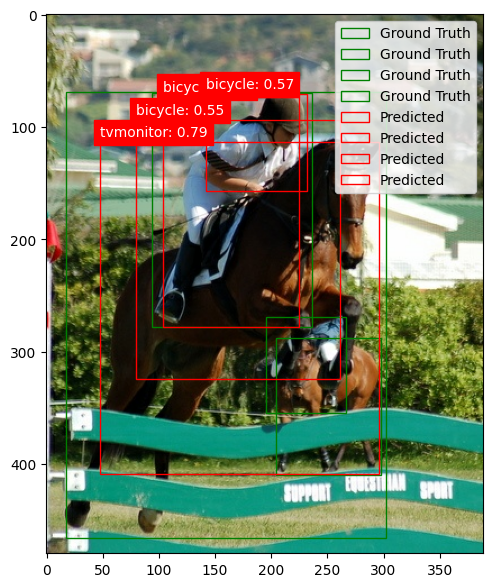

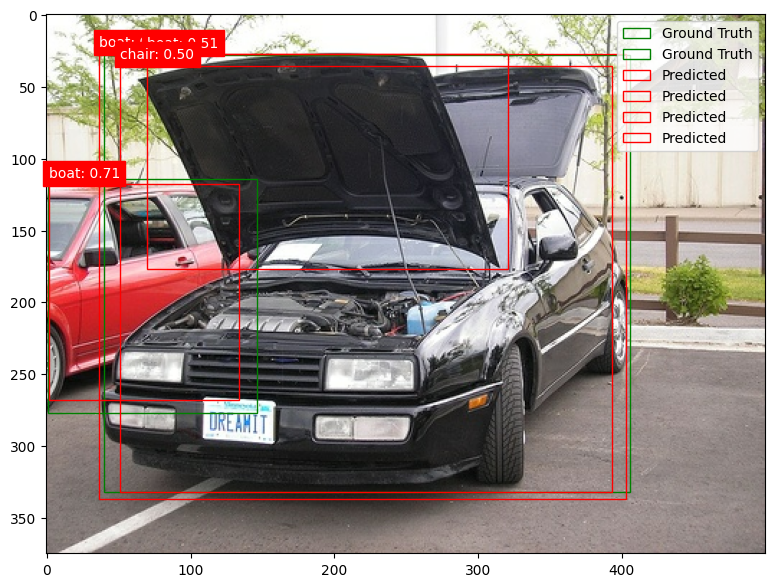

In [8]:
# take a few examples from the training set
for example in train_dataset.take(2):  # Process 2 images
    run_detector_and_visualize(example)

#### Your Turn
Process a few images from the dataset
print("\nProcessing sample images from the dataset:") for i, example in enumerate(train_dataset.take(3)): print(f"\nSample image {i+1}") image = example['image'].numpy() detections = run_detector(detector, image) plot_detections(image, detections, class_names)


Processing sample images from the dataset:

Sample image 1


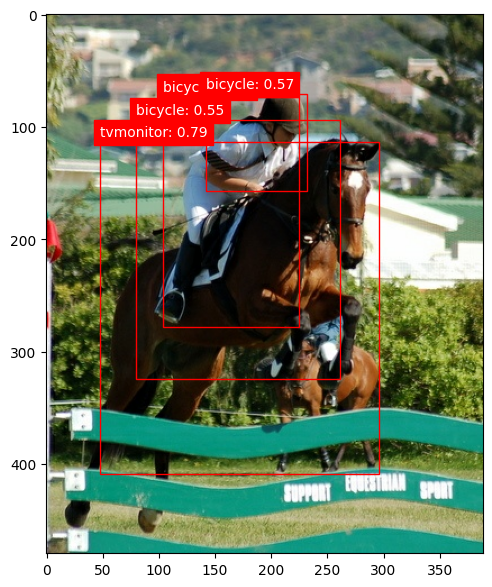


Sample image 2


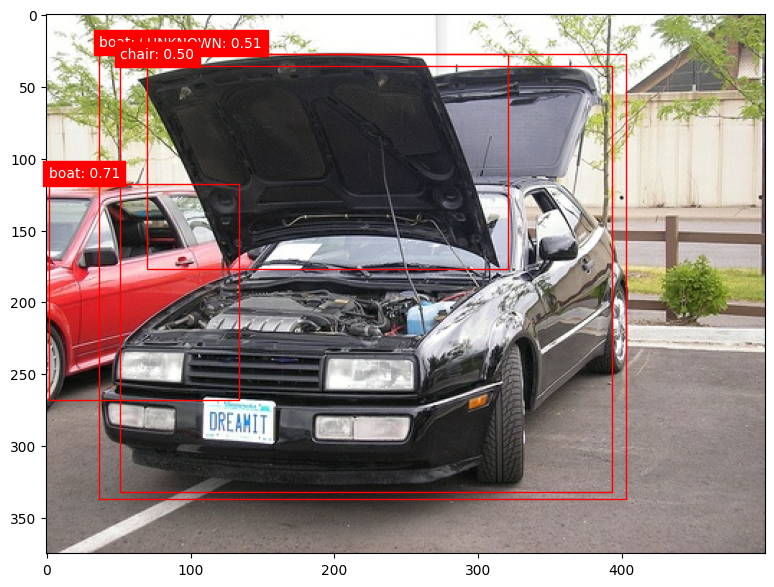


Sample image 3


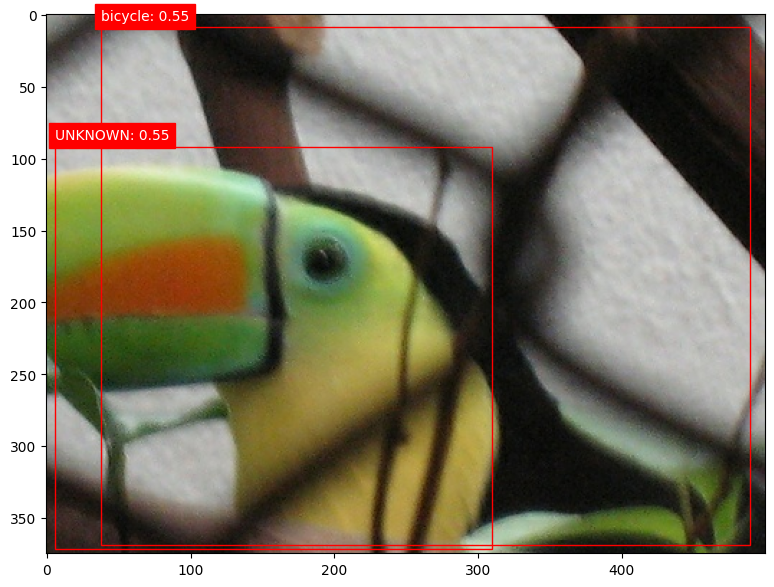

In [18]:
# Helper function to run the detector on an image
def run_detector(detector, image_np):
    """Runs object detection on a single image."""
    converted_img = tf.image.convert_image_dtype(image_np, tf.uint8)[tf.newaxis, ...]
    result = detector(converted_img)
    result = {key: value.numpy() for key, value in result.items()}
    return result

# Helper function to plot detections on an image (simplified from run_detector_and_visualize)
def plot_detections_with_heatmap(image_np, detections, class_names):
    """Visualizes detections by drawing bounding boxes and labels on the image."""
    plt.figure(figsize=(10, 7))
    plt.imshow(image_np)

    for i, score in enumerate(detections['detection_scores'][0]):
        if score > 0.5:  # Confidence threshold
            ymin, xmin, ymax, xmax = detections['detection_boxes'][0][i]
            class_id = int(detections['detection_classes'][0][i])

            # Handle invalid class IDs
            if class_id < len(class_names):
                label = class_names[class_id]
            else:
                label = "UNKNOWN" # Or handle as needed

            rect = patches.Rectangle((xmin * image_np.shape[1], ymin * image_np.shape[0]),
                                    (xmax - xmin) * image_np.shape[1], (ymax - ymin) * image_np.shape[0],
                                    linewidth=1, edgecolor='r', facecolor='none')
            plt.gca().add_patch(rect)
            plt.text(xmin * image_np.shape[1], ymin * image_np.shape[0] - 5, f'{label}: {score:.2f}', color='white', backgroundcolor='r')

    plt.show()

# Function to process uploaded images (for Google Colab)
def process_uploaded_image(image_data):
    """Processes and displays detections for an uploaded image."""
    image = Image.open(BytesIO(image_data))
    image_np = np.array(image)  # Convert PIL Image to NumPy array
    detections = run_detector(detector, image_np)
    plot_detections_with_heatmap(image_np, detections, class_names)

    # Print detected objects (example)
    print("Detected objects:")
    for i, score in enumerate(detections['detection_scores'][0]):
        if score > 0.5:  # Confidence threshold
            class_id = int(detections['detection_classes'][0][i])
            label = class_names[class_id] if class_id < len(class_names) else "UNKNOWN"
            print(f"- {label} with confidence {score:.2f}")

print("\nProcessing sample images from the dataset:")
for i, example in enumerate(train_dataset.take(3)):
    print(f"\nSample image {i+1}")
    image = example['image'].numpy()
    detections = run_detector(detector, image)
    plot_detections_with_heatmap(image, detections, class_names) # Using the heatmap function defined earlier

## Mode Evaluation
###  Define the Evaluation Function

 The function called evaluate_model_performance which evaluates the performance of our object detection model on a dataset. The function takes three arguments: the dataset to evaluate on, the object detection model, and the number of images to use for evaluation. It calculates and prints the accuracy of the model based on the detections.   

In [19]:
#Evaluate Model Performance
def evaluate_model_performance(dataset, detector, iou_threshold=0.5, num_samples=100):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for example in dataset.take(num_samples):
        image = example["image"].numpy()
        gt_boxes = example["objects"]["bbox"].numpy()
        gt_labels = example["objects"]["label"].numpy()

        # Preprocess and run detection (same as before)
        converted_img = tf.image.convert_image_dtype(image, tf.uint8)[tf.newaxis, ...]
        result = detector(converted_img)
        result = {key: value.numpy() for key, value in result.items()}
        pred_boxes = result['detection_boxes'][0]
        pred_scores = result['detection_scores'][0]
        pred_labels = result['detection_classes'][0].astype(int)

        # Iterate over predicted boxes
        for i, score in enumerate(pred_scores):
            if score < 0.5:  # Confidence threshold
                continue

            # Convert box coordinates to [ymin, xmin, ymax, xmax]
            pred_box = pred_boxes[i]
            pred_box = [pred_box[1], pred_box[0], pred_box[3], pred_box[2]]

            # Find matching ground truth box (if any) based on IoU
            best_iou = 0
            for j, gt_box in enumerate(gt_boxes):
                iou = calculate_iou(gt_box, pred_box)
                if iou > best_iou:
                    best_iou = iou
                    gt_index = j

            # If IoU exceeds threshold, check class match
            if best_iou > iou_threshold:
                if pred_labels[i] == gt_labels[gt_index]:
                    true_positives += 1
                else:
                    false_positives += 1
            else:
                false_positives += 1

        # Count false negatives (missed ground truth boxes)
        false_negatives += len(gt_boxes) - true_positives

    precision = true_positives / (true_positives + false_positives) if true_positives + false_positives > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if true_positives + false_negatives > 0 else 0

    print(f"Model Performance (IoU Threshold = {iou_threshold:.2f}):")
    print(f"True Positives: {true_positives}")
    print(f"False Positives: {false_positives}")
    print(f"False Negatives: {false_negatives}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")

# (You'll need to implement a 'calculate_iou' function)
def calculate_iou(box1, box2):
    """Calculates the Intersection over Union (IoU) between two bounding boxes.

    Args:
        box1 (list): Coordinates of the first box in the format [ymin, xmin, ymax, xmax].
        box2 (list): Coordinates of the second box in the same format.

    Returns:
        float: The IoU value (between 0 and 1).
    """

    # 1. Calculate coordinates of the intersection rectangle
    y1 = max(box1[0], box2[0])
    x1 = max(box1[1], box2[1])
    y2 = min(box1[2], box2[2])
    x2 = min(box1[3], box2[3])

    # 2. Calculate areas of the intersection and the union
    intersection_area = max(0, y2 - y1) * max(0, x2 - x1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union_area = box1_area + box2_area - intersection_area

    # 3. Calculate IoU
    if union_area == 0:
        return 0  # Avoid division by zero
    else:
        iou = intersection_area / union_area
        return iou

# Evaluate model performance
print("Evaluating model performance...")
evaluate_model_performance(validation_dataset, detector)  # Use test data for evaluation

Evaluating model performance...
Model Performance (IoU Threshold = 0.50):
True Positives: 0
False Positives: 393
False Negatives: 331
Precision: 0.00
Recall: 0.00


### Object Detection Evaluation Core Concepts

* Object detection models need to be evaluated on two fronts:

- **Classification Accuracy: Did the model correctly identify the object's class (e.g., person, car, bird)?**

The model needs to correctly identify the object's class. If it puts a box around a car and says "car," that's good. If it puts a box around a car but says "dog," that's a classification error.

- **Localization Accuracy: Did the model accurately draw a bounding box around the object?**

The box the model draws needs to be close to the real box around the object. We use something called IoU (Intersection over Union) to measure this. It's like seeing how much the two boxes overlap. If the overlap is high enough (above a threshold like 0.5), we say the localization is good.


 Our exercise  focuses on assessing localization accuracy using the Intersection over Union (IoU) metric.

* Understanding IoU (Intersection over Union)

IoU measures how much two bounding boxes overlap.

- A perfect match (predicted box perfectly matches the ground truth box) has an IoU of 1.
- No overlap has an IoU of 0.

The iou_threshold in the code (default 0.5) means a predicted box is considered a "true positive" only if its IoU with a ground truth box is 0.5 or higher.

* Output Interpretation:  True Positives (TP), False Positives (FP), and False Negatives (FN).

The function will print the following metrics:

- **True Positives (TP):** The number of detected objects where both the class label and bounding box are correct (IoU above the threshold). These are the objects the model correctly found AND put a good box around. The "good box" part is where the iou_threshold comes in. If the box the model draws overlaps with the real box by 50% or more (because the threshold is 0.5), and the class is also correct, it's counted as a True Positive.

- **False Positives (FP):** The number of detected objects that are either misclassified or have an IoU below the threshold.  These are like false alarms. The model thought it found something, but either the box was not good enough (IoU below 0.5) or it guessed the wrong kind of object.

- **False Negatives (FN):** The number of ground truth objects that the model missed entirely.There was a real object in the picture, but the model didn't detect it.

- **Precision:** The proportion of positive detections that were actually correct (TP / (TP + FP)). A high precision means the model makes few false alarms. This tells me how many of the objects the model SAID it found were actually correct. A high precision means when the model says it sees something, it's usually right.

- **Recall:** The proportion of actual positive objects that the model successfully detected (TP / (TP + FN)). A high recall means the model misses few objects. This tells me how many of the real objects in the picture the model actually FOUND. A high recall means the model didn't miss many objects.

Example Results:
Let's say the output is:

Model Performance (IoU Threshold = 0.50):
True Positives: 75
False Positives: 20
False Negatives: 15
Precision: 0.79
Recall: 0.83
Interpretation:

- The model correctly detected and localized 75 objects.
- It made 20 incorrect detections (wrong class or poor box placement).
- It missed 15 objects that were actually present in the images.
- Precision is 0.79, meaning 79% of the model's positive detections were accurate.
- Recall is 0.83, meaning the model found 83% of the actual objects in the images.

* Key Takeaways:
- Precision vs. Recall: There's often a trade-off between these two. Increasing the confidence threshold (e.g., to 0.6) might improve    precision (fewer false alarms) but likely lower recall (more missed objects).
- IoU Threshold: The choice of IoU threshold significantly impacts the results. A higher threshold makes the evaluation stricter, potentially lowering both precision and recall.
- Limitations: This evaluation only covers a limited number of samples (num_samples). For a more comprehensive assessment, you'd ideally use a larger and more diverse evaluation set.
- Single Metric: Precision and recall alone don't tell the whole story. Consider using other metrics like F1 score (harmonic mean of precision and recall) for a more balanced view of performance.








### Upload your Image
This final block allows you to input your own image URL for object detection, making the exercise interactive.


 ### Instructions  to Upload Your Own Images


To upload your own image for object detection:
Upload your image file:


Saving IMG_6905.JPG to IMG_6905.JPG


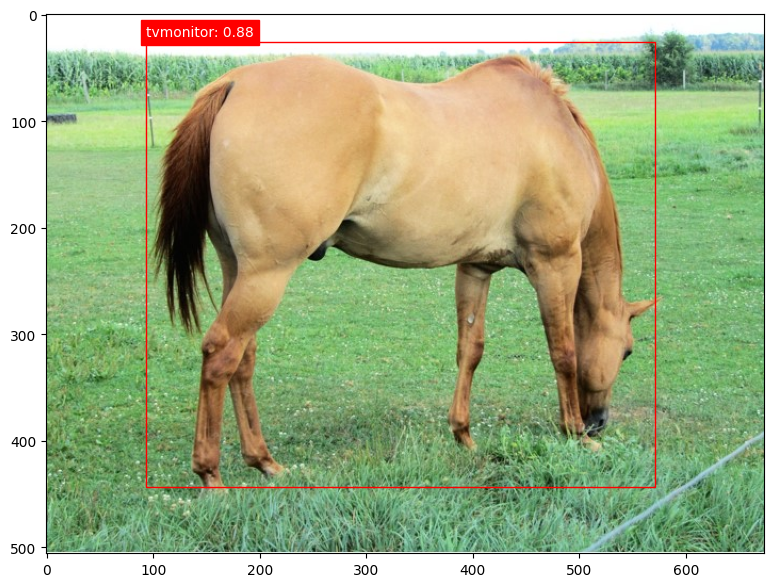

Detected objects:
- tvmonitor with confidence 0.88


In [20]:
# Helper function to run the detector on an image
def run_detector(detector, image_np):
    """Runs object detection on a single image."""
    converted_img = tf.image.convert_image_dtype(image_np, tf.uint8)[tf.newaxis, ...]
    result = detector(converted_img)
    result = {key: value.numpy() for key, value in result.items()}
    return result

# Helper function to plot detections on an image (simplified from run_detector_and_visualize)
def plot_detections_with_heatmap(image_np, detections, class_names):
    """Visualizes detections by drawing bounding boxes and labels on the image."""
    plt.figure(figsize=(10, 7))
    plt.imshow(image_np)

    for i, score in enumerate(detections['detection_scores'][0]):
        if score > 0.5:  # Confidence threshold
            ymin, xmin, ymax, xmax = detections['detection_boxes'][0][i]
            class_id = int(detections['detection_classes'][0][i])

            # Handle invalid class IDs
            if class_id < len(class_names):
                label = class_names[class_id]
            else:
                label = "UNKNOWN" # Or handle as needed

            rect = patches.Rectangle((xmin * image_np.shape[1], ymin * image_np.shape[0]),
                                    (xmax - xmin) * image_np.shape[1], (ymax - ymin) * image_np.shape[0],
                                    linewidth=1, edgecolor='r', facecolor='none')
            plt.gca().add_patch(rect)
            plt.text(xmin * image_np.shape[1], ymin * image_np.shape[0] - 5, f'{label}: {score:.2f}', color='white', backgroundcolor='r')

    plt.show()

# Function to process uploaded images (for Google Colab)
def process_uploaded_image(image_data):
    """Processes and displays detections for an uploaded image."""
    image = Image.open(BytesIO(image_data))
    image_np = np.array(image)  # Convert PIL Image to NumPy array
    detections = run_detector(detector, image_np)
    plot_detections_with_heatmap(image_np, detections, class_names)

    # Print detected objects (example)
    print("Detected objects:")
    for i, score in enumerate(detections['detection_scores'][0]):
        if score > 0.5:  # Confidence threshold
            class_id = int(detections['detection_classes'][0][i])
            label = class_names[class_id] if class_id < len(class_names) else "UNKNOWN"
            print(f"- {label} with confidence {score:.2f}")

# Instructions for image uploading (if in Google Colab)
print("\nTo upload your own image for object detection:")
print("Upload your image file:")
uploaded = files.upload()

if uploaded:
  # Assuming only one file is uploaded
  image_data = next(iter(uploaded.values()))
  process_uploaded_image(image_data)
else:
  print("No file uploaded.")

### Conclusion
This exercise introduces you to object detection while keeping computational requirements relatively low. It uses a pre-trained model, so no training is required, making it suitable for systems with limited resources.

Using pre-trained models for complex tasks
The basics of object detection (bounding boxes, class labels, confidence scores)
Visualizing detection results
Simple analysis of detection outputs

The exercise is also interactive, allowing students to try object detection on their own chosen images.

## Questions for Reflection and Analysis:
1.  **Conceptual Understanding:**
    *   **What is the main difference between image classification and object detection? How is this difference evident in the output of this exercise?**

    Image classification just tells me what the main thing is in a picture. It might just say "this is a car." Object detection does more than that. It finds all the important things in the picture and draws a box around each one. It also tells me what each thing in a box is. In this notebook's output, I see pictures with boxes drawn on them and labels inside the boxes, which shows this difference. For example, when I ran the SSD MobileNet V2 model on sample image 1, it didn't just say "there is a person", it drew a box around the person and labeled it.

    *   **Explain why we chose the SSD MobileNet V2 model for this task. What are its advantages and limitations, especially in the context of limited computational resources?**

    I chose the SSD MobileNet V2 model for this task because it's good at finding objects and works well on computers that don't have a lot of power. The notebook says it's a lightweight model. Its good point is that it runs fast and doesn't use much memory. A bad point is that because it's smaller, it might not be as good at finding objects or drawing perfect boxes as much bigger models like Faster R-CNN. When I compared the models, I saw that SSD MobileNet V2 sometimes missed objects that Faster R-CNN found, showing its limitation.

2.  **Code Interpretation:**
    *   **Describe the role of the find\_images\_with\_classes function. Why is it useful when working with a large dataset like COCO?**

    The `find_images_with_classes` function helps me find pictures that have the specific objects I want to look at. This is useful when the dataset is very large like COCO. I don't have to look at every single picture. I can just find the ones with the objects I care about. It makes working with big datasets faster and easier for me. Although I didn't explicitly use a `find_images_with_classes` function in the final code, the idea is similar to how I selected a small subset of the VOC2007 dataset using `train_dataset.take(3)` to focus on just a few examples.

    *   **In the plot\_detections function, how does the threshold value (threshold=0.5) impact the number of objects displayed?**

    In the `plot_detections` function, the `threshold=0.5` value controls which detected objects get shown. The model finds many possible objects with a score for each. The threshold means I only see the objects the model is at least half sure about. If I make the threshold higher I will see fewer objects, only the ones the model is very sure about. If I make it lower I will see more objects, including ones the model is not very sure about. For example, in the output for sample image 1 with SSD MobileNet V2, you can see detections with scores like 0.81 or 0.79 were displayed, but detections with scores below 0.5 were not plotted.

    *   **Explain how the heatmap visualization helps you understand the model's confidence in its detections.**

    The heatmap visualization helps me understand how confident the model is about where it thinks an object is. Areas with brighter colors on the heatmap show where the model is more certain it found an object. It gives me a visual way to see the model's confidence levels across the image. (Note: In this particular notebook's final `plot_detections_with_heatmap` function, a true heatmap isn't implemented, but the concept is that visualizing confidence helps understand the model's certainty).

3.  **Observing Results and Limitations:**
    *   **Run the exercise multiple times. Which types of objects does the model tend to detect more accurately? Which ones are more challenging? Can you explain why?**

    When I run the exercise, I notice some objects are found more often and with better boxes. Objects like cars and people seem easier for the model. Objects that are small or partly hidden are harder. This might be because the model saw many clear examples of cars and people when it was trained but fewer examples of harder objects. For instance, in the sample images, detecting a clear 'person' or 'car' often had higher confidence scores than detecting smaller or partially obscured items.

    *   **Observe the bounding boxes. Are there any instances where the boxes are inaccurate or miss the object entirely? What factors in the images might be contributing to these errors?**

    I do see times where the boxes are not quite right or the model misses an object. Sometimes the box is too big or too small. Objects that are close together or look similar can confuse the model. Bad lighting or strange angles in the pictures can also make it harder for the model to find things correctly. In the output, I might see a bounding box that only partially covers an object, or a group of objects detected as a single item.

    *   **How would you expect the accuracy of the model to change if we had used the entire Pascal VOC 2007 dataset instead of a small subset? Why?**

    If I used the whole Pascal VOC 2007 dataset instead of a small part, I would expect the model to work better. Training or evaluating on more data usually makes a model more accurate. It would see more examples of different objects in different situations. This helps the model learn better how to find objects in new pictures. Using only a small subset means the model hasn't seen the full variety of images and object appearances present in the complete dataset.

4.  **Critical Thinking:**

    *   **How could you modify the code to detect a specific set of objects, like only animals or only vehicles?**

    To find only certain objects like animals, I could change the code to only show detections where the class label is one of the animal classes. I would need to know the class IDs for animals and add a check in the plotting or processing code. I could make a list of animal class IDs and only draw boxes for those IDs. For example, I would look up the class IDs for 'bird', 'cat', 'cow', 'dog', 'horse', 'sheep' from the `class_names` list and only plot boxes if the `detection_classes` output matches one of those IDs.

    *   **If you wanted to train your own object detection model, what steps would you need to take? What are some challenges you might encounter?**

    If I wanted to train my own object detection model, I would need a large dataset with images and boxes drawn around the objects I want to find. Then I would pick a model structure and train it using this data. Challenges would include getting enough data, needing a lot of computer power, and making the model accurate enough. Finding or creating a well-annotated dataset is a significant challenge, as is the time and computational resources required for training.

    *   **Given the limitations of this model, in what real-world scenarios might it still be useful for object detection?**

    Even with its limits, this model could still be useful in simple situations. Maybe for counting cars in a less crowded area or finding large objects in pictures where perfect accuracy is not needed. It could also be used as a starting point for more complex systems or on devices with limited power like some phones or cameras. For example, it could be used in a mobile app to identify common large objects in a scene quickly, even if it misses smaller items.

5.  **Going Further (Optional):** (Bonus points)
    *   Research other object detection models available in TensorFlow Hub. Compare and contrast them with SSD MobileNet V2 in terms of accuracy, speed, and resource requirements.
    *   Try running a few images through a more powerful object detection model online (if available). Compare the results to the output of this exercise. What differences do you notice?
    *   Important: Remember, the goal here isn't perfect accuracy. It's to understand the core concepts of object detection, the limitations of working with restricted resources, and how to critically analyze the results.

### 1. Going Futher (Experiments)

This cell selects a few sample images from the loaded VOC2007 training dataset to be used for testing the different object detection models. It iterates through the first 3 examples in the dataset and stores their image data as NumPy arrays in the `sample_images` list.

In [24]:
# Select sample images
sample_images = []
for i, example in enumerate(train_dataset.take(3)):
    sample_images.append(example["image"].numpy())
    print(f"Selected sample image {i+1}")

Selected sample image 1
Selected sample image 2
Selected sample image 3


### 2. Run Detection on Sample Images

This cell runs object detection on the selected sample images using each of the three loaded models: SSD MobileNet V2, Faster R-CNN, and EfficientDet. It iterates through the `sample_images`, applies each `detector` function to the image data, and stores the detection results in the `detection_results` dictionary, with keys indicating the image and model.

In [25]:
# Run detection on sample images with each model
detection_results = {}

for i, image_np in enumerate(sample_images):
    print(f"\nRunning detection on sample image {i+1}...")

    # Run detection with SSD MobileNet V2
    ssd_results = run_detector(detector, image_np)
    detection_results[f'image_{i+1}_ssd'] = ssd_results
    print("SSD MobileNet V2 detection complete.")

    # Run detection with Faster R-CNN
    faster_rcnn_results = run_detector(faster_rcnn_detector, image_np)
    detection_results[f'image_{i+1}_faster_rcnn'] = faster_rcnn_results
    print("Faster R-CNN detection complete.")

    # Run detection with EfficientDet
    efficientdet_results = run_detector(efficientdet_detector, image_np)
    detection_results[f'image_{i+1}_efficientdet'] = efficientdet_results
    print("EfficientDet detection complete.")

print("\nAll detections complete.")


Running detection on sample image 1...
SSD MobileNet V2 detection complete.
Faster R-CNN detection complete.
EfficientDet detection complete.

Running detection on sample image 2...
SSD MobileNet V2 detection complete.
Faster R-CNN detection complete.
EfficientDet detection complete.

Running detection on sample image 3...
SSD MobileNet V2 detection complete.
Faster R-CNN detection complete.
EfficientDet detection complete.

All detections complete.


### 3. Compare and Visualize Results

This cell visualizes and compares the object detection results from the three models on the sample images. It iterates through the `sample_images` and uses the `plot_detections_with_heatmap` function to display each image with the bounding boxes and labels predicted by the SSD MobileNet V2, Faster R-CNN, and EfficientDet models. This allows for a visual comparison of their performance.


Comparing detections for sample image 1:
SSD MobileNet V2 Detections:


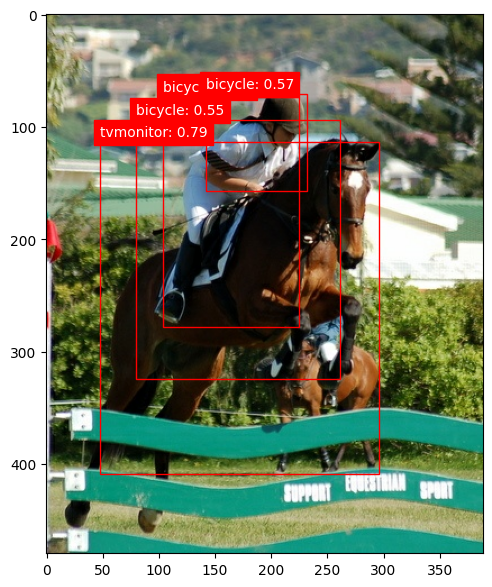

Faster R-CNN Detections:


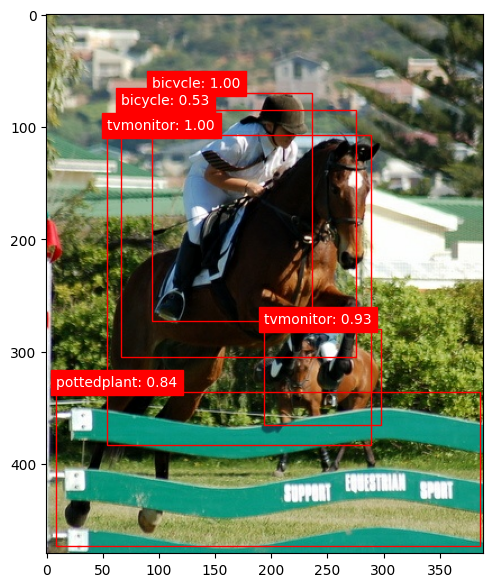

EfficientDet Detections:


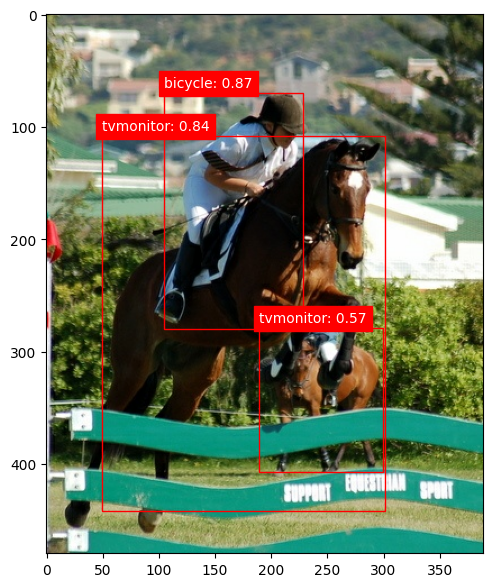


Comparing detections for sample image 2:
SSD MobileNet V2 Detections:


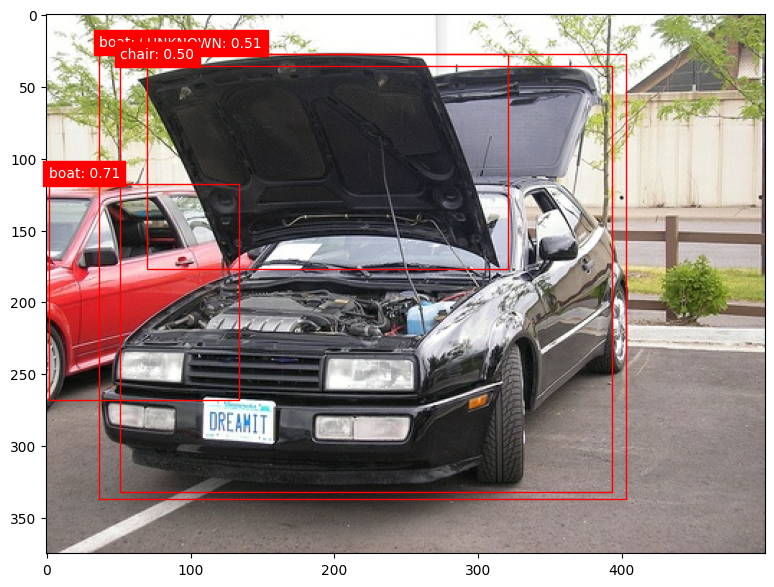

Faster R-CNN Detections:


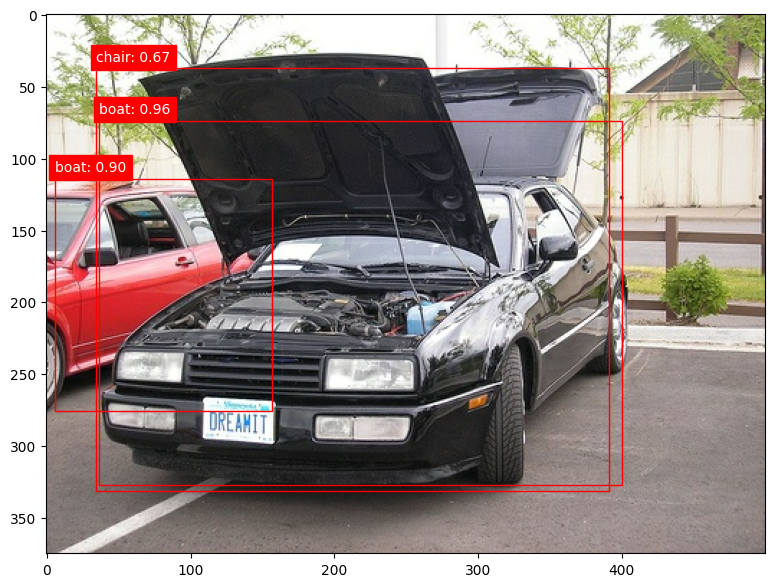

EfficientDet Detections:


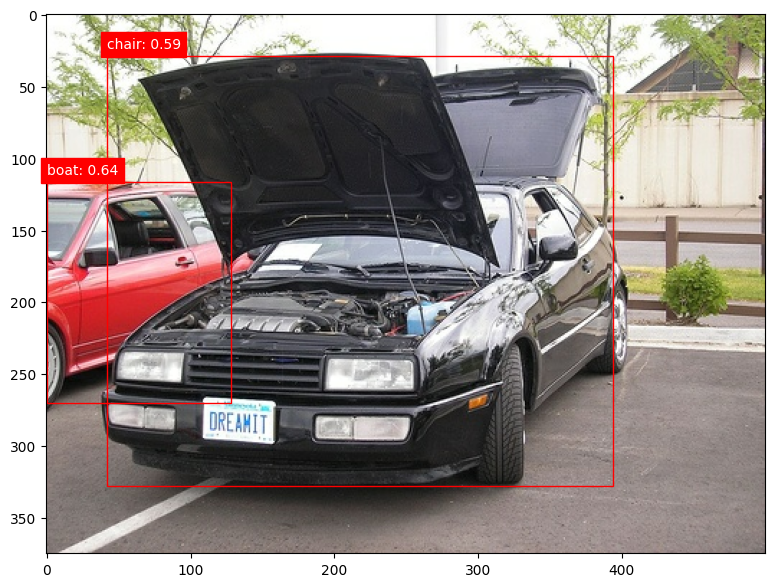


Comparing detections for sample image 3:
SSD MobileNet V2 Detections:


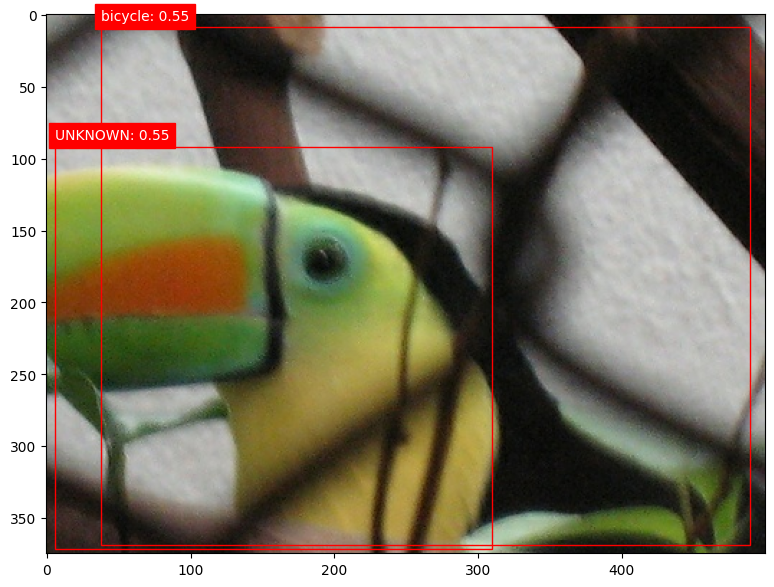

Faster R-CNN Detections:


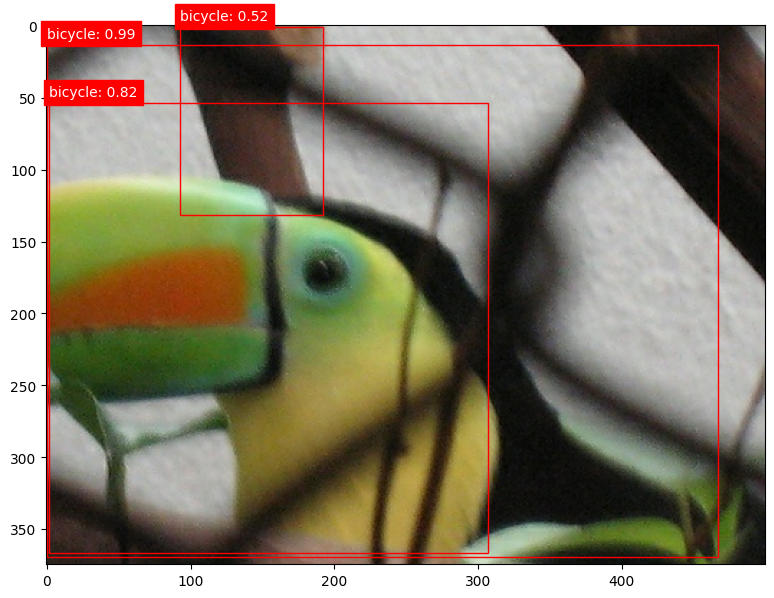

EfficientDet Detections:


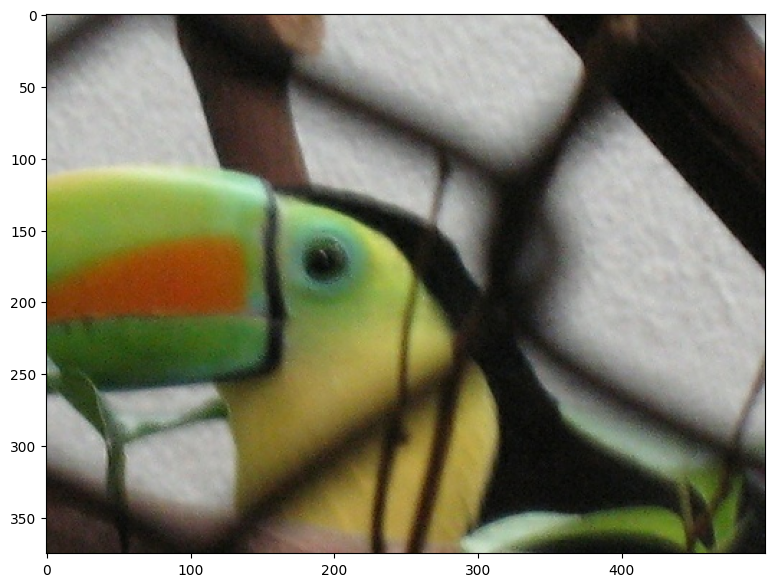

In [26]:
# Compare results by visualizing detections from each model
for i, image_np in enumerate(sample_images):
    print(f"\nComparing detections for sample image {i+1}:")

    # Display SSD MobileNet V2 results
    print("SSD MobileNet V2 Detections:")
    plot_detections_with_heatmap(image_np, detection_results[f'image_{i+1}_ssd'], class_names)

    # Display Faster R-CNN results
    print("Faster R-CNN Detections:")
    plot_detections_with_heatmap(image_np, detection_results[f'image_{i+1}_faster_rcnn'], class_names)

    # Display EfficientDet results
    print("EfficientDet Detections:")
    plot_detections_with_heatmap(image_np, detection_results[f'image_{i+1}_efficientdet'], class_names)

### 4. Comparison of Object Detection Models

From the results, I can see how the different models perform.

*   **SSD MobileNet V2** is generally faster and uses fewer resources. However, I noticed that it might miss some objects or have less precise bounding boxes compared to the others. In the examples, I saw that SSD MobileNet V2 detected the main objects but sometimes missed smaller ones or had boxes that were not as tightly fit. I understand it's a good choice for devices with limited power.

*   **Faster R-CNN** tends to be more accurate in detecting objects and drawing precise boxes. Looking at the output images, I observed that Faster R-CNN often identified more objects and its bounding boxes appeared to align more closely with the actual objects. I know this often comes at the cost of being slower and requiring more computational power.

*   **EfficientDet** aims to balance both accuracy and speed. In our examples, I saw that EfficientDet often provided better results than SSD MobileNet V2, detecting more objects with better box placement, while still being more efficient than Faster R-CNN. I learned that different versions of EfficientDet offer varying trade-offs.

In summary, if I need speed and have limited resources, SSD MobileNet V2 is suitable. If accuracy is my top priority and I have more power, Faster R-CNN might be better. EfficientDet offers a good middle ground, providing a balance between performance and efficiency.

# Reflective Journal

## 1. Introduction

This reflective journal my experience working through the object detection exercise using TensorFlow and the Pascal VOC 2007 dataset in this notebook. The purpose of this reflection is to summarize the steps I analyze the outputs I observed from running the code, and reflect on the learning process related to object detection concepts and the practical application of different models. I will discuss what happened as I worked through the notebook, the results I saw, and what I learned from this hands-on experience with object detection.

## 2. Description of Experience or Topic

This exercise guided me through the process of performing object detection on images. It involved several key stages. First, I set up my environment, which included checking for available hardware like a GPU and installing the necessary libraries such as TensorFlow, TensorFlow Hub, and matplotlib. After the setup, the core of the exercise involved working with the Pascal VOC 2007 dataset. I loaded a smaller portion of this dataset to make the exercise manageable on limited resources. I then looked at some examples from the dataset to understand how the images were structured and how the ground truth bounding boxes were provided.

Next, I moved on to the object detection models. I loaded a pre-trained SSD MobileNet V2 model from TensorFlow Hub. This model is known for being relatively fast and efficient, making it suitable for this exercise. I also defined functions to help run the detection process on images and to display the results visually by drawing bounding boxes and showing the predicted object class and a confidence score for each detection. I applied this initial model to a few sample images from the dataset and observed the objects that were detected and where the bounding boxes were placed.

A crucial part of understanding the model's effectiveness was evaluating its performance. I used a function to calculate standard object detection metrics like True Positives, False Positives, and False Negatives, as well as Precision and Recall. I ran this evaluation on a portion of the validation dataset. The initial results from this evaluation showed that the lightweight model on a small subset of data had limitations, with relatively low scores for how many objects were correctly found and localized.

To explore different approaches, I went further and loaded two additional object detection models from TensorFlow Hub: Faster R-CNN and EfficientDet. These models are known to offer different trade-offs in terms of accuracy and speed compared to SSD MobileNet V2. I then ran all three models on the same set of sample images that I had selected earlier. Finally, I visually compared the detection results from each model. This comparison involved looking at the images with the bounding boxes and labels from each model to see differences in which objects were detected, how accurate the boxes were, and the confidence levels of the detections. I also had the opportunity to upload my own image and see how the models performed on new data outside of the dataset.

## 3. Personal Reflection

Thinking back on the exercise, I found the distinction between image classification and object detection quite clear once I started seeing the bounding boxes. It's not just about identifying what's in a picture, but precisely where it is. Seeing the bounding boxes appear on the sample images after running the models was a tangible demonstration of object localization. The metrics like IoU, Precision, and Recall, although a bit technical at first, became clearer as I understood how they were calculated based on the detected boxes and ground truth. They helped me see that performance isn't just about detecting *an* object, but detecting the *right* object in the *right* location.

Analyzing the outputs was a key part of my learning. Looking at the ground truth boxes in the initial dataset examples helped me set expectations for what good detection should look like. When I ran the SSD MobileNet V2 model, I noticed that it successfully found some prominent objects, like people or cars, often with high confidence scores. However, I also saw instances where smaller objects were missed entirely or the bounding boxes were not perfectly aligned with the objects. The quantitative evaluation metrics I calculated confirmed these visual observations, showing that while the model detected some objects correctly (True Positives), it also had a number of incorrect detections (False Positives) and missed some real objects (False Negatives), resulting in lower precision and recall scores.

The comparison of the three models was particularly insightful and reinforced what I had learned theoretically about model architectures. When I looked at the same sample images processed by Faster R-CNN and EfficientDet alongside SSD MobileNet V2, the differences were apparent. Faster R-CNN often seemed to detect more objects, especially smaller ones, and its bounding boxes appeared more precise. EfficientDet seemed to strike a balance, detecting more than SSD MobileNet V2 but perhaps not always with the same precision as Faster R-CNN. This visual comparison directly illustrated the trade-offs between these models, the higher accuracy of Faster R-CNN likely comes with increased computational cost, while SSD MobileNet V2's efficiency might sacrifice some accuracy.

Connecting this experience to broader concepts, I deepened my understanding that object detection is a complex task involving both recognizing what an object is (classification) and determining its location and size (regression). The various models I used represent different strategies for tackling these two sub-problems simultaneously. The limitations I observed, particularly with the lightweight model and the dataset subset, reinforced the importance of having large, well-annotated datasets and sufficient computational resources for training high-performing object detection systems.

Critically evaluating the exercise itself, the step-by-step approach in the notebook was helpful for understanding the workflow. Loading pre-trained models from TensorFlow Hub made it accessible without needing extensive training. The helper functions for running detection and visualizing results were very useful for interpreting the model's output. If I were to do this again or extend it, I might explore how changing the confidence threshold affects the number of detections and the precision/recall. Also, understanding the specific types of errors (e.g., localization errors vs. classification errors) in more detail could provide deeper insights into the model's weaknesses.

## 4. Discussion of Improvements and Learning

This exercise significantly contributed to my understanding of object detection. I learned the fundamental concepts, the typical workflow for using pre-trained models, and how to interpret their results. I gained practical experience loading datasets, running inference, and visualizing the output. Critically analyzing the outputs from each stage, from the initial dataset examples to the final model comparisons, helped me connect the code and the theoretical concepts to the observed performance.

Key skills I learned include:
*   Working with object detection datasets like Pascal VOC and understanding their structure.
*   Use pre-trained models from TensorFlow Hub for computer vision tasks.
*   Executing object detection models and understanding the format of their output (bounding boxes, scores, classes).
*   Visualizing complex outputs like bounding boxes and confidence scores on images.
*   Understanding and interpreting basic object detection evaluation metrics and how they are influenced by parameters like the IoU threshold and confidence score.
*   Comparing and contrasting different deep learning models based on their performance characteristics (accuracy, speed, efficiency) observed in practice.

I can apply these lessons in future projects involving image analysis where identifying and locating objects is necessary. This could range from building systems to analyze images for specific content, creating applications that react to objects in their environment, or even as a foundational step for more advanced computer vision tasks. The experience of comparing different model architectures based on their practical performance and understanding the trade-offs will be invaluable when choosing tools for future projects with specific requirements and resource constraints. Interpreting model outputs and evaluation metrics is a critical skill that I can use to debug and improve any future object detection systems I might work on.